# Clustering

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sb

# Import and data wrangling
- selection and engineering of features
- normalization
    - transform NAN values into uniform format which is `np.nan`

In [2]:
# import cleaned and prepared data of consultations in RW
rw_data = pd.read_pickle("data/rw-cleaned-prepared-dynamic-data-phase1.pickle")

In [3]:
# columns to keep
spatio_temporal_columns = [
    "medical_case_consultation_date_day", # time
    "health_facility_name", "health_facility_longitude", "health_facility_latitude",  #spatial variant 1 = hf location
    "District", "Sector", "Cell", "Village", "longitude_village", "latitude_village" #spatial variant 2 = patient's origin
]

demographic_columns = [
    #"patient_id",
    "patient_age",
    "patient_gender"
]

symptoms_of_interest = ["PE212 - Respiratory rate (breaths/min) - 8469",
    "S39 - Cough - 7817", 
    "PE18 - Chest indrawing - 7811",
    "S180 - How is the infant feeding currently? - 7516",
    "S46 - Convulsions in present illness - 8355",
    "BC - Axillary temperature - 7823 categorical",
    "PE125 - Observation of movement - 8388",
    "S96 - Unable to drink or breastfeed - 7871",
    "S157 - Vomiting everything - 8026",
    "OS9 - Unconscious or Lethargic (Unusually sleepy) - 7378",
    "PE63 - Stiff neck - 8391",
    "PE19 - Stridor in calm child - 7812",
    "S42 - Duration of fever (days) - 7819 categorical",
    "S124 - Significant weight loss - 7539",
    "S118 - Significant hemoptysis (>1 episode) - 7941",
    "S176 - Cough duration (days) - 7731 categorical",
    "E46 - Recent close contact with somebody with TB - 7820",
    "PE220 - Identifiable source of fever? - 8399",
    "A55 - Urinary dipstick - 7648",
    "PE134 - Measles rash and associated signs - 8386",
    "PE109 - Scarlet fever rash - 8344",
    "PE106 - Non specific viral rash - 7930",
    "PE218 - Unexplained bleeding - 8107",
    "S153 - Diarrhea (stools are looser or more watery than normal) - 7649",
    "S98 - Number of loose or liquid stools over the past 24 hours - 7882 categorical",
    "S149 - Yellow appearing skin or eyes (jaundice) - 7630",
    "PE191 - Jaundice - 8036",
    "S74 - Abnormal vaginal discharge - 8377",
    "S81 - Urethral discharge - 7810",
    "S79 - Genital lesion - 7867",
    "BC7 - Weight for age (z-score) - 8434 categorical",
    "BC95 - Weight for height - 7451 categorical",
    "BC61 - MUAC for age z-score - 7839 categorical"#formr: "BC - MUAC in cm - 7833 categorical"
]

# add symptoms which appear in several columns because they are actually diagnoses
symptoms_to_find = ["fever without source: presumed bacterial infection", "fever without source: presumed viral illness", "suspicion of tuberculosis"]
symptoms_to_add = [s for symp in symptoms_to_find for s in rw_data.columns if symp in s]
print("Adding the following", len(symptoms_to_add), "symptoms to symptoms_of_interest:\n", symptoms_to_add)
symptoms_of_interest = symptoms_of_interest + symptoms_to_add

Adding the following 12 symptoms to symptoms_of_interest:
 ['DF130 - fever without source: presumed bacterial infection - 30851', 'DF - fever without source: presumed bacterial infection - 26194', 'DF130 - fever without source: presumed bacterial infection - 8480', 'DF130 - fever without source: presumed bacterial infection - 30602', 'DF129 - fever without source: presumed viral illness - 30853', 'DF - fever without source: presumed viral illness - 26192', 'DF129 - fever without source: presumed viral illness - 8481', 'DF129 - fever without source: presumed viral illness - 30604', 'DF9 - suspicion of tuberculosis - 30886', 'DF - suspicion of tuberculosis - 26232', 'DF9 - suspicion of tuberculosis - 8539', 'DF9 - suspicion of tuberculosis - 30643']


In [4]:
# select features for clustering
data = rw_data[np.concatenate((demographic_columns, symptoms_of_interest))]

# engineer malaria feature based on instructions of domain experts
data["malaria"] = rw_data["A50 - Microscopy for malarial parasites - 7837 categorical"]#[e if e == np.nan else rw_data["A51 - Malaria rapid diagnostic test - 7838 categorical"][i] for i, e in enumerate(rw_data["A50 - Microscopy for malarial parasites - 7837 categorical"])]
data.loc[data["malaria"].isna(), "malaria"] == rw_data.loc[data["malaria"].isna(), "A51 - Malaria rapid diagnostic test - 7838 categorical"]

# number of consultation which have no value in "A50 - Microscopy for malarial parasites - 7837 categorical" but a value in "A50 - Microscopy for malarial parasites - 7837 categorical"
sum(rw_data["A50 - Microscopy for malarial parasites - 7837 categorical"].isna() & ~rw_data["A50 - Microscopy for malarial parasites - 7837 categorical"].isna())

# engineer diagnoses features: 
# get features which are diagnosis, merge them and add replace them with merged and final feature
list_diagnoses_as_features = [col for col in data.columns if col[0:2] == "DF"]
diagnoses_data_as_features = data[list_diagnoses_as_features]
diagnoses_data_as_features.columns = [col.split(" - ")[1] for col in diagnoses_data_as_features.columns]
diagnoses_data_as_features = diagnoses_data_as_features.groupby(diagnoses_data_as_features.columns, axis=1, dropna=False).sum(min_count=1)

data = data[[col for col in data.columns if not (col in list_diagnoses_as_features)]] # remove old diagnoses features

# add final and merged diagnoses features
for col in diagnoses_data_as_features.columns:
    data[col] = diagnoses_data_as_features[col]

# normalize NAN values in data
data = data.apply(lambda x : x.replace({
    "not_available": np.nan, 
    'Test/Assessment is unavailable': np.nan, # for malaria feature
    'Unavailable': np.nan
    }), 
    axis=1
)

# convert to float if possible
data = data.astype(float, errors="ignore")

data

C:\Users\sidla\AppData\Local\Temp\ipykernel_2072\35389681.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["malaria"] = rw_data["A50 - Microscopy for malarial parasites - 7837 categorical"]#[e if e == np.nan else rw_data["A51 - Malaria rapid diagnostic test - 7838 categorical"][i] for i, e in enumerate(rw_data["A50 - Microscopy for malarial parasites - 7837 categorical"])]


,patient_age,patient_gender,PE212 - Respiratory rate (breaths/min) - 8469,S39 - Cough - 7817,PE18 - Chest indrawing - 7811,S180 - How is the infant feeding currently? - 7516,S46 - Convulsions in present illness - 8355,BC - Axillary temperature - 7823 categorical,PE125 - Observation of movement - 8388,S96 - Unable to drink or breastfeed - 7871,...,S74 - Abnormal vaginal discharge - 8377,S81 - Urethral discharge - 7810,S79 - Genital lesion - 7867,BC7 - Weight for age (z-score) - 8434 categorical,BC95 - Weight for height - 7451 categorical,BC - MUAC in cm - 7833 categorical,malaria,fever without source: presumed bacterial infection,fever without source: presumed viral illness,suspicion of tuberculosis
0,0.0,male,36.0,Yes,No,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,more than -2 z-score,>= 12.5 cm,NaN,NaN,NaN,NaN
1,2.0,female,34.0,Yes,No,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,more than -2 z-score,>= 12.5 cm,NaN,NaN,NaN,NaN
2,2.0,female,NaN,No,NaN,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,more than -2 z-score,>= 12.5 cm,NaN,NaN,NaN,NaN
3,0.0,female,NaN,Yes,No,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,-2 z-score,>= 12.5 cm,NaN,NaN,NaN,Rejected
4,1.0,male,38.0,Yes,No,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,more than -2 z-score,>= 12.5 cm,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1506,10.0,male,36.0,Yes,No,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,more than -2 z-score,>= 12.5 cm,Negative,NaN,NaN,NaN
1507,5.0,female,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1508,5.0,female,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1509,3.0,male,24.0,Yes,No,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,more than -2 z-score,>= 12.5 cm,Negative,NaN,NaN,NaN


# Data description
- summary
    - check for uniformly distributed features
    - data types
    - variance
- missingness (MAR?)
- multi-correlation (VIF)

## Summary

In [5]:
# summarize features by computing min, max, mean, std etc.
# NOTE: features need to be transformed to numerics on order to be considered by python's built in function: describe,
numericalized_data = data.apply(lambda x : x.replace({ # gives more insight to features if turned to numerics before summary
    "female": 1, "male": 0,
    "Yes": 1, "No": 0, 
    "Absent": 0, "Present": 1,
    # special categorical symptoms need to be manually numericalized based on domain knowledge
    "< 38 °C": 0, ">= 38°C": 1, # for BC - Axillary temperature - 7823
    "< 2 weeks": 0,  ">= 2 weeks": 1, # for S176 - Cough duration (days) - 7731 categorical
    "more than -2 z-score": 0, "-2 z-score": 1, "less than -2 z-score": 2, # for BC7 - Weight for age (z-score) - 8434 categorical and BC95 - Weight for height - 7451 categorical  
    '>= 12.5 cm': 0, '>= 11.5 < 12.5 cm': 1, '< 11.5 cm' : 2, # for BC - MUAC in cm - 7833 categorical
    'Accepted': 1, 'Manually added': 1, 'Rejected': 0, # for DF130 - fever without source: presumed bacterial infection - 30602 and DF129 - fever without source: presumed viral illness
    'Negative': 0, 'Positive': 1, # for malaria feature})
    'Feeding well': 0, 'Not feeding well': 1, 'Not feeding at all': 2, # for "S180 - How is the infant feeding currently? - 7516"
    'Movement without stimulation': 0, 'Movement only when stimulated': 1, 'No movement even when stimulated': 2, # for "PE125 - Observation of movement - 8388"
    '< 4 days': 0, '>= 4 days < 7 days': 1, '>= 7 days < 14 days': 2, '>= 14 days': 3, # for "S42 - Duration of fever (days) - 7819 categorical"
    'Normal': 0, 'Pathologic': 1, # for "A55 - Urinary dipstick - 7648"
    '<3': 0, '>=3': 1, '>=4': 2, '>=5': 3, '>=6': 4, # for "S98 - Number of loose or liquid stools over the past 24 hours - 7882 categorical"
  })).astype(float)
summary_data = numericalized_data.describe().transpose().reset_index().rename(columns={"index": "feature"}) # bring into better format

# get data type according to python
summary_data["dtype"] = [data[feature].dtype for feature in summary_data["feature"]]

# capture unique values --> are there anomalies?
summary_data["unique_values"] = [data[feature].dropna().unique() for feature in summary_data["feature"]]

# get number of unique values (NAN not counted)
summary_data["number_unique_values"] = [len(features_unique_values) for features_unique_values in summary_data["unique_values"]]

# determine type of each feature: binary, categorical or continues
# NOTE: 16 is chosen as threshold for determining features as categorical so that feature patient_age is regarded as categorical
summary_data["type"] = ["binary" if len(data[feature].dropna().unique()) <= 2 else "categorical" if len(data[feature].dropna().unique()) <= 16 else "continues" for feature in summary_data["feature"]]

summary_data

,feature,count,mean,std,min,25%,50%,75%,max,dtype,unique_values,number_unique_values,type
0,patient_age,47886.0,3.268868,3.549796,0.0,0.0,2.0,5.0,15.0,float64,"[0.0, 2.0, 1.0, 6.0, 4.0, 5.0, 3.0, 9.0, 8.0, ...",16,categorical
1,patient_gender,47806.0,0.528511,0.499192,0.0,0.0,1.0,1.0,1.0,object,"[male, female]",2,binary
2,PE212 - Respiratory rate (breaths/min) - 8469,16905.0,34.776806,10.859431,5.0,28.0,35.0,40.0,144.0,float64,"[36.0, 34.0, 38.0, 37.0, 40.0, 32.0, 18.0, 35....",125,continues
3,S39 - Cough - 7817,32055.0,0.551053,0.497395,0.0,0.0,1.0,1.0,1.0,object,"[Yes, No]",2,binary
4,PE18 - Chest indrawing - 7811,17461.0,0.016666,0.128019,0.0,0.0,0.0,0.0,1.0,object,"[No, Yes]",2,binary
5,S180 - How is the infant feeding currently? - ...,1402.0,0.087019,0.313147,0.0,0.0,0.0,0.0,2.0,object,"[Feeding well, Not feeding well, Not feeding a...",3,categorical
6,S46 - Convulsions in present illness - 8355,32943.0,0.001214,0.034825,0.0,0.0,0.0,0.0,1.0,object,"[No, Yes]",2,binary
7,BC - Axillary temperature - 7823 categorical,35088.0,0.179264,0.383578,0.0,0.0,0.0,0.0,1.0,object,"[< 38 °C, >= 38°C]",2,binary
8,PE125 - Observation of movement - 8388,1397.0,0.022906,0.184008,0.0,0.0,0.0,0.0,2.0,object,"[Movement without stimulation, Movement only w...",3,categorical
9,S96 - Unable to drink or breastfeed - 7871,31561.0,0.002725,0.052130,0.0,0.0,0.0,0.0,1.0,object,"[No, Yes]",2,binary


## Missingness

In [6]:
# missingness of features
missingness_features = pd.DataFrame({"feature":data.columns})

# compute number of nan values per feature 
missingness_features["number_nan_values"] = [sum(data[feature].isna()) for feature in missingness_features["feature"]]

# compute share of nan values per feature
missingness_features["share_nan_values"] = missingness_features["number_nan_values"]/data.shape[0]

# sort based on share_nan_values
missingness_features = missingness_features.sort_values(by="share_nan_values", ascending=False)

missingness_features

,feature,number_nan_values,share_nan_values
30,S81 - Urethral discharge - 7810,47878,0.999833
31,S79 - Genital lesion - 7867,47857,0.999394
29,S74 - Abnormal vaginal discharge - 8377,47646,0.994988
36,fever without source: presumed bacterial infec...,47297,0.987700
37,fever without source: presumed viral illness,47103,0.983649
24,PE218 - Unexplained bleeding - 8107,47103,0.983649
20,A55 - Urinary dipstick - 7648,47002,0.981539
13,PE19 - Stridor in calm child - 7812,46896,0.979326
16,S118 - Significant hemoptysis (>1 episode) - 7941,46811,0.977551
8,PE125 - Observation of movement - 8388,46489,0.970827


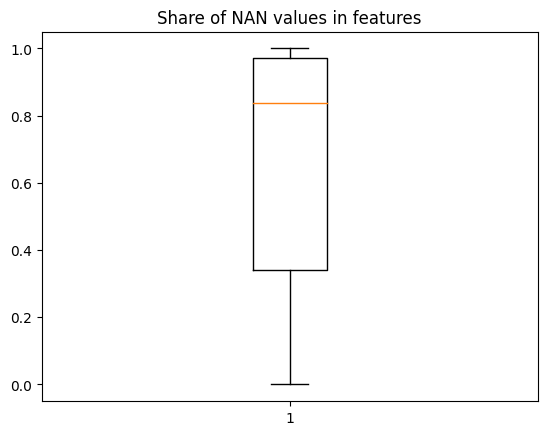

In [7]:
# boxplot of share of nan values in feautures
plt.boxplot(missingness_features["share_nan_values"])
plt.title("Share of NAN values in features")
plt.show()

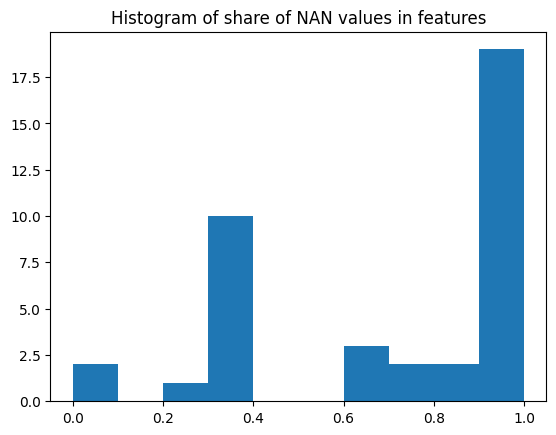

In [8]:
# distribution of share of nan values in features
plt.hist(missingness_features["share_nan_values"])
plt.title("Histogram of share of NAN values in features")
plt.show()

In [9]:
# analys

## Multi-correlation (VIF)

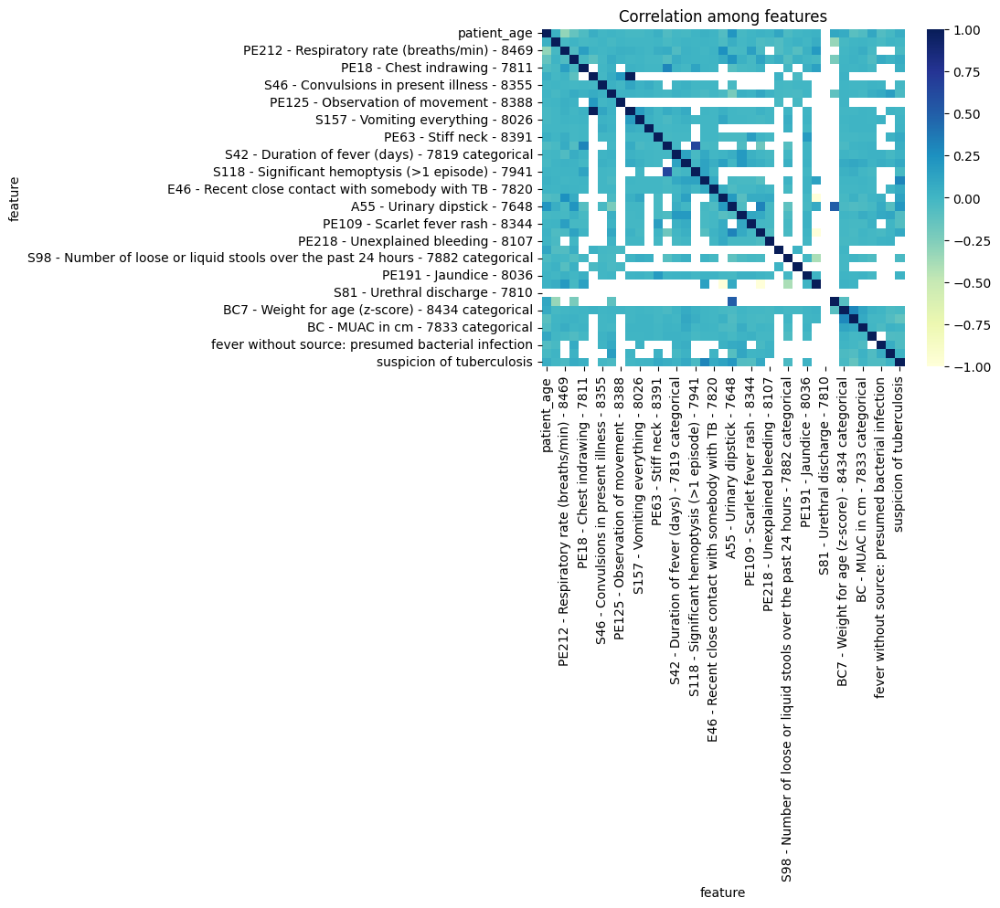

In [10]:
# visualize correlation of features
missingness_correlation_heatmap = sb.heatmap(numericalized_data.corr(), cmap="YlGnBu", annot=False)
plt.title("Correlation among features")
plt.xlabel("feature")
plt.ylabel("feature")

# displaying heatmap
plt.show()

In [11]:
# check for multicollinearity: is given if VIF (= variance inflation factor) is high (usually if vif > 3) source: https://www.investopedia.com/terms/v/variance-inflation-factor.asp#:~:text=A%20variance%20inflation%20factor%20(VIF)%20is%20a%20measure%20of%20the,in%20a%20multiple%20regression%20model.
"""from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = numericalized_data.columns
vif['VIF'] = [variance_inflation_factor(numericalized_data.values, i) for i in range(numericalized_data.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif"""

'from statsmodels.stats.outliers_influence import variance_inflation_factor\nvif = pd.DataFrame()\nvif[\'Features\'] = numericalized_data.columns\nvif[\'VIF\'] = [variance_inflation_factor(numericalized_data.values, i) for i in range(numericalized_data.shape[1])]\nvif[\'VIF\'] = round(vif[\'VIF\'], 2)\nvif = vif.sort_values(by = "VIF", ascending = False)\nvif'

## Conclusion - data description
- `S81 - Urethral discharge - 7810` is having a std of 0. 
- ``PE212 - Respiratory rate (breaths/min) - 8469`` is the only feature that is continues. The rest is binary or categorical. This means that the data cannot be used with K-Means, inter alia because it is not in th same scale which means continues and categorical features will always have a stronger impact on the clustering as they can have higher distance.
- Missingness is huge. Based on the `Histogram of share of NAN values in features`, the majority of features consists of more than 50% of NAN values. Moreover, there is evidence for Missingness at random (MAR), meaning ...
- 

In consideration of all this, the best clustering algo is `K-prototypes` because:
    1. it can deal with mixed type data.
    2. it can take in the data as it is, i. e. NAN values become an own category and do not need to be processed.
    3. existing repos and extensive research on it makes preprocessing, implementation and evaluation easy.
        - https://cse.hkust.edu.hk/~qyang/Teaching/537/Papers/huang98extensions.pdf
        - overview about clustering: https://axon.cs.byu.edu/Dan/678/papers/Cluster/Xu.pdf

# Dimension reduction
- drop features with too many NANs based on arbitrarily chosen threshold
- drop features with too much correlation with others (if VIF > 5)
- PCA?

# Preprocessing: NAN
- possible NAN strategies:
    1. NAN is treated as an additional category which enables us to cluster the data nearly as it is. (Note: only nearly because continues features still need to be imputed for `K-Prototypes` to work. Same goes for categorical features which are numerical e.g. patient_age)
    2. Imputation: 
        1. common approach: NAN of binary and categorical features are imputed with median and continues variables with mean. However, due to the huge amount of NAN values, we create a huge bias which can be severe in some cases. For example, for the binary feature `S39 - Cough - 7817` the median is 1 meaning that an imputation following the common approach leads to 47886-32055 = 15831 consultations/patients whose cough status is originally not known (= NAN) to be treated as if they have a cough. This is clearly distorts the data. Same goes for categorical values which are For this simple reason, this imputation method is not considered further. 
        2. approach of considering domain and context: NAN means that symptom/diagnosis is not there, i. e. the value for the underlying patient is normal. This means often a NAN will be imputed with 0 aka "not there" but in some cases we need domain knowledge to know what is the normal value: e. g. for feature `PE212 - Respiratory rate (breaths/min) - 8469` we need to know what is the normal respiratory rate. This approach also enables numericalising all features which means one can use the more resource efficient `K-Means` instead of `K-Prototypes`. For this to be possible one must ensure that the to be numericalised categorical features are having an ordinal scale from normal to severe since `K-Means` would treat their numerical representation as such. For example, the categories of the feature `S42 - Duration of fever (days) - 7819 categorical` would be imputed and numericalised in the following way:
            - `NAN` : 0 
            - `< 4 days`: 1 
            - `>= 4 days < 7 days`: 2
            - `>= 7 days < 14 days`: 3
            - `>= 14 days`: 4
            
            This is the ideal imputation strived for for every feature. The original ordinal scale persists after imputation and numericalisation so that `K-Means` treats patients having fever for more than 14 days or between 7 and 14 days more similar than patients having fever less than 4 days since the numbers 3 and 4 are more close to each other than to 1. 
            The last thing one needs to consider following this approach is that after imputation and numericalisation all binary and categorical features are scaled the same. if this makes sense, however, is a question one can not easily answer. Therefore the matter is neglected for now. The effect of it should still be recognized as `K-Means` does not make any difference between the distance of having a cough or no cough and the distance of having less than 4 days of fever or a fever for 4 to 7 days.
- considered NAN strategies:
    1. NAN as category for categorical features and NAN imputed by mean for continues variables
    2. NAN imputation based on domain and context

- other possible NAN strategies but not considered:
    1. Imputation with KNN

## 1. NAN strategy - as raw as possible
NAN as category for categorical features and NAN imputed by mean for continues variables

In [12]:
rawly_preprocessed_data = data.copy()

# impute continues features with mean 
continues_features=summary_data.loc[summary_data["type"] == "continues", "feature"]
for f in continues_features:
    mean = np.mean(rawly_preprocessed_data[f])
    rawly_preprocessed_data.loc[rawly_preprocessed_data[f].isna(), f] = mean #[mean if e == np.nan else e for e in rawly_preprocessed_data[f]]

# impute remaining numerical features with median (remaining once are all categorical)
numerical_features=summary_data.loc[summary_data["dtype"] == "float64", "feature"]
for f in numerical_features:
    median = np.median(rawly_preprocessed_data[f])
    rawly_preprocessed_data.loc[rawly_preprocessed_data[f].isna(), f] = median #[mean if e == np.nan else e for e in rawly_preprocessed_data[f]]

# stringify NAN values in all other features making it an additional category
rawly_preprocessed_data = rawly_preprocessed_data.fillna("NaN") 
rawly_preprocessed_data

,patient_age,patient_gender,PE212 - Respiratory rate (breaths/min) - 8469,S39 - Cough - 7817,PE18 - Chest indrawing - 7811,S180 - How is the infant feeding currently? - 7516,S46 - Convulsions in present illness - 8355,BC - Axillary temperature - 7823 categorical,PE125 - Observation of movement - 8388,S96 - Unable to drink or breastfeed - 7871,...,S74 - Abnormal vaginal discharge - 8377,S81 - Urethral discharge - 7810,S79 - Genital lesion - 7867,BC7 - Weight for age (z-score) - 8434 categorical,BC95 - Weight for height - 7451 categorical,BC - MUAC in cm - 7833 categorical,malaria,fever without source: presumed bacterial infection,fever without source: presumed viral illness,suspicion of tuberculosis
0,0.0,male,36.000000,Yes,No,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,more than -2 z-score,>= 12.5 cm,NaN,NaN,NaN,NaN
1,2.0,female,34.000000,Yes,No,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,more than -2 z-score,>= 12.5 cm,NaN,NaN,NaN,NaN
2,2.0,female,34.776806,No,NaN,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,more than -2 z-score,>= 12.5 cm,NaN,NaN,NaN,NaN
3,0.0,female,34.776806,Yes,No,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,-2 z-score,>= 12.5 cm,NaN,NaN,NaN,Rejected
4,1.0,male,38.000000,Yes,No,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,more than -2 z-score,>= 12.5 cm,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1506,10.0,male,36.000000,Yes,No,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,more than -2 z-score,>= 12.5 cm,Negative,NaN,NaN,NaN
1507,5.0,female,34.776806,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1508,5.0,female,34.776806,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1509,3.0,male,24.000000,Yes,No,NaN,No,< 38 °C,NaN,No,...,NaN,NaN,NaN,more than -2 z-score,more than -2 z-score,>= 12.5 cm,Negative,NaN,NaN,NaN


In [13]:
# check if there are no NaN values anymore
rawly_preprocessed_data.isna().sum().sum()==0

True

## 2. NAN strategy - as contextual as possible
NAN imputation based on domain and context:
- demographic features 'patient_age', 'patient_gender': impute NAN with median
- binary symptoms e.g. 'S39 - Cough - 7817': impute NAN with 0 
- categorical features (symptoms and diagnoses): impute NAN so that NAN signifies normal state (original ordinal scale of feature needs to be considered)

In [14]:
# imputate and numericalize based on domain and context
contextually_preprocessed_data = data.copy()

# rules for imputing and numericalisation
domain_based_data_preprocessing = {
        'patient_age': {"method":"median"}, # "method" refers to the NAN processing method
        'patient_gender': {"method":"median", "conversion":{"female": 1, "male": 0}},
        'PE212 - Respiratory rate (breaths/min) - 8469': {"method":"domain", "conversion":{np.nan : 14}},  # check wth doman if nan = 14 makes sense
        'S39 - Cough - 7817': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
        'PE18 - Chest indrawing - 7811': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
        'S180 - How is the infant feeding currently? - 7516': {"method":"domain", "conversion":{np.nan : 0, 'Feeding well': 0, 'Not feeding well': 1, 'Not feeding at all': 2}},
        'S46 - Convulsions in present illness - 8355': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
        'BC - Axillary temperature - 7823 categorical': {"method":"domain", "conversion":{np.nan : 0, "< 38 °C": 0, ">= 38°C": 1}}, # check wth doman if nan = 0 makes sense
        'PE125 - Observation of movement - 8388': {"method":"domain", "conversion":{np.nan : 0, 'Movement without stimulation': 0, 'Movement only when stimulated': 1, 'No movement even when stimulated': 2}},
        'S96 - Unable to drink or breastfeed - 7871': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
        'S157 - Vomiting everything - 8026': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
        'OS9 - Unconscious or Lethargic (Unusually sleepy) - 7378': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
        'PE63 - Stiff neck - 8391': {"method":"domain", "conversion":{np.nan : 0, "Present": 1, "Absent": 0}}, 
        'PE19 - Stridor in calm child - 7812': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
                'S42 - Duration of fever (days) - 7819 categorical': {"method":"domain", "conversion":{np.nan : 0, '< 4 days': 1, '>= 4 days < 7 days': 2, '>= 7 days < 14 days': 3, '>= 14 days': 4}},
        'S124 - Significant weight loss - 7539': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
        'S118 - Significant hemoptysis (>1 episode) - 7941': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
                'S176 - Cough duration (days) - 7731 categorical': {"method":"domain", "conversion":{np.nan : 0, "< 2 weeks": 1, ">= 2 weeks": 2}},
        'E46 - Recent close contact with somebody with TB - 7820': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
        'PE220 - Identifiable source of fever? - 8399': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
        'A55 - Urinary dipstick - 7648': {"method":"domain", "conversion":{np.nan : 0, "Pathologic": 1, "Normal": 0}},
        'PE134 - Measles rash and associated signs - 8386': {"method":"domain", "conversion":{np.nan : 0, "Present": 1, "Absent": 0}},
        'PE109 - Scarlet fever rash - 8344': {"method":"domain", "conversion":{np.nan : 0, "Present": 1, "Absent": 0}},
        'PE106 - Non specific viral rash - 7930': {"method":"domain", "conversion":{np.nan : 0, "Present": 1, "Absent": 0}},
        'PE218 - Unexplained bleeding - 8107': {"method":"domain", "conversion":{np.nan : 0, "Present": 1, "Absent": 0}},
        'S153 - Diarrhea (stools are looser or more watery than normal) - 7649': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
                'S98 - Number of loose or liquid stools over the past 24 hours - 7882 categorical': {"method":"domain", "conversion":{np.nan : 0, '<3': 1, '>=3': 2, '>=4': 3, '>=5': 4, '>=6': 5}},
        'S149 - Yellow appearing skin or eyes (jaundice) - 7630': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
        'PE191 - Jaundice - 8036': {"method":"domain", "conversion":{np.nan : 0, "Present": 1, "Absent": 0}},
        'S74 - Abnormal vaginal discharge - 8377': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
        'S81 - Urethral discharge - 7810': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}}, 
        'S79 - Genital lesion - 7867': {"method":"domain", "conversion":{np.nan : 0, "Yes": 1, "No": 0}},
                'BC7 - Weight for age (z-score) - 8434 categorical': {"method":"domain", "conversion":{np.nan : 0, "more than -2 z-score": 0, "-2 z-score": 1, "less than -2 z-score": 2}}, # check wth doman if nan =0 makes sense
                'BC95 - Weight for height - 7451 categorical': {"method":"domain", "conversion":{np.nan : 0, "more than -2 z-score": 0, "-2 z-score": 1, "less than -2 z-score": 2}}, # check wth doman if nan = 0 makes sense
                "BC61 - MUAC for age z-score - 7839 categorical": {"method":"domain", "conversion":{np.nan : 0, "> -2 z-score": 0, "-2 z-score": 1, "< -2 z-score": 2}},
        'malaria': {"method":"domain", "conversion":{np.nan : 0, "Positive": 1, "Negative": 0}},
                'fever without source: presumed bacterial infection': {"method":"domain", "conversion":{np.nan : 0, 'Accepted': 1, 'Manually added': 1, 'Rejected': 0,}}, # check wth doman if nan = 0 makes sense
                'fever without source: presumed viral illness': {"method":"domain", "conversion":{np.nan : 0, 'Accepted': 1, 'Manually added': 1, 'Rejected': 0,}}, # check wth doman if nan = 0 makes sense
        'suspicion of tuberculosis': {"method":"domain", "conversion":{np.nan : 0, "Accepted": 1, "Rejected": 0}}# check wth doman if nan = 0 makes sense
}

# impute nan and numericalise features based on domain knowledge
for feature in domain_based_data_preprocessing:
        if "conversion" in domain_based_data_preprocessing[feature]: 
                contextually_preprocessed_data[feature] = contextually_preprocessed_data[feature].replace(domain_based_data_preprocessing[feature]["conversion"])
        if domain_based_data_preprocessing[feature]["method"] == "median": 
                median=contextually_preprocessed_data[feature].median()
                contextually_preprocessed_data[feature] = contextually_preprocessed_data[feature].fillna(median)
        if domain_based_data_preprocessing[feature]["method"] == "mean": 
                mean=contextually_preprocessed_data[feature].mean()
                contextually_preprocessed_data[feature] = contextually_preprocessed_data[feature].fillna(mean)

contextually_preprocessed_data = contextually_preprocessed_data.astype(float)
contextually_preprocessed_data

,patient_age,patient_gender,PE212 - Respiratory rate (breaths/min) - 8469,S39 - Cough - 7817,PE18 - Chest indrawing - 7811,S180 - How is the infant feeding currently? - 7516,S46 - Convulsions in present illness - 8355,BC - Axillary temperature - 7823 categorical,PE125 - Observation of movement - 8388,S96 - Unable to drink or breastfeed - 7871,...,S74 - Abnormal vaginal discharge - 8377,S81 - Urethral discharge - 7810,S79 - Genital lesion - 7867,BC7 - Weight for age (z-score) - 8434 categorical,BC95 - Weight for height - 7451 categorical,BC - MUAC in cm - 7833 categorical,malaria,fever without source: presumed bacterial infection,fever without source: presumed viral illness,suspicion of tuberculosis
0,0.0,0.0,36.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2.0,1.0,34.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2.0,1.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,38.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1506,10.0,0.0,36.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1507,5.0,1.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1508,5.0,1.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1509,3.0,0.0,24.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
# check if there are no NaN values anymore
contextually_preprocessed_data.isna().sum().sum()==0

True

## Conclusion - NAN preprocessing 

1. Raw as possble:
    1. Pro:
        - uses data as it is
        - no bas created (nherently exstng bas persst)
        - can be used for automated NAN preprocessng followng clar protocol whch enables havng a fully automat ppelne for the survellance syndrome dashboard through whch doman experts deally also want to use for selectng features and performng clusterng on ther own.
    2. Con:
        - requires K-Prototypes which is more resource intense
2. Contextual:
    1. Pro:
        - ntuton reasonable
        - smultaneously numercalsng all features even categorcal once enables usage of c-means nstead of c-prototypes whch s less resource ntense
    2. Con:
        - only possble wth doman nowledge hence contextual preprocessng cannot be automated


# Perform clustering

## K-Prototypes for clustering raw data
Followed: https://github.com/tech-data/cutomer-segmentation/blob/main/Customer%20Segmentation-Kprototypes.ipynb

In [16]:
from kmodes.kprototypes import KPrototypes

#convert to matrix
dfMatrix = rawly_preprocessed_data.to_numpy()

# get positions of categorical and binary features
catFeaturesPos = [i for i, f in enumerate(summary_data["type"]) if f == "binary" or f == "categorical"]

In [ ]:
#Elbow method to detect number of K
cost = []
for cluster in range(1, 10):
    try:
        kprototype = KPrototypes(n_jobs = -1, n_clusters = cluster, init = 'Huang', random_state = 0)
        kprototype.fit_predict(dfMatrix, categorical = catFeaturesPos)
        cost.append(kprototype.cost_)
        print('Cluster initiation: {}'.format(cluster))
    except:
        break

plt.plot(cost)
plt.xlabel('K')
plt.ylabel('cost')
plt.show

In [ ]:
pip install kneed

In [ ]:
# cost (sum distance): confirm visual clue of elbow plot
# KneeLocator class will detect elbows if curve is convex; if concave, will detect knees
from kneed import KneeLocator
cost_knee_c3 = KneeLocator(
        x=range(1,10), 
        y=cost, 
        S=0.1, curve="convex", direction="decreasing", online=True)

K_cost_c3 = cost_knee_c3.elbow   
print("elbow at k =", f'{K_cost_c3:.0f} clusters')

In [17]:
# run clustering wth optimal K=4
kprototype = KPrototypes(n_jobs = -1, n_clusters = 4, init = 'Huang', random_state = 1) # n_clusters = K_cost_c3
rawly_preprocessed_data['cluster'] = kprototype.fit_predict(dfMatrix, categorical = catFeaturesPos)

## K-Means clustering for data imputed and numericalised by domain and context

In [18]:
!pip install yellowbrick


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [19]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

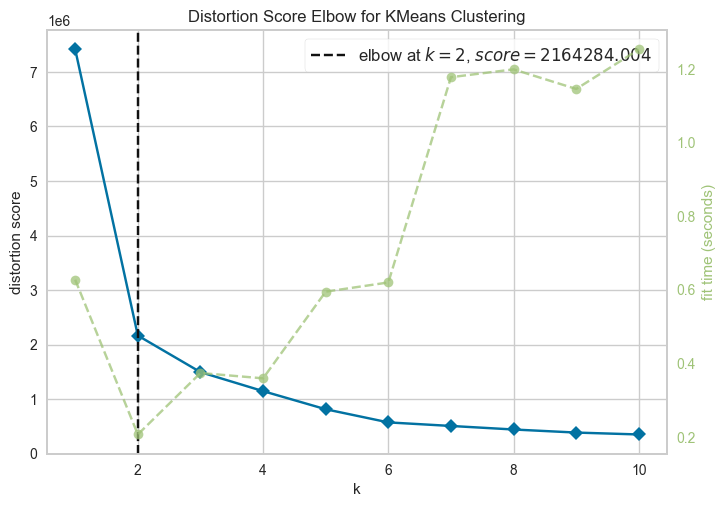

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [20]:
# Finding the optimal number of clusters using the Elbow method with yellowbrick
model = KMeans(n_init=10)
visualizer = KElbowVisualizer(model, k=(1,11))
visualizer.fit(contextually_preprocessed_data)
n_clusters = visualizer.elbow_value_ # optimal number of clusters
visualizer.show()

In [21]:
# Performing clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=n_clusters, n_init=10, random_state=2).fit(contextually_preprocessed_data)

# Adding the column 'cluster' to the dataframe
contextually_preprocessed_data["cluster"] = kmeans.labels_

# Evaluation - which NAN preprocessing is best?
Analyse the difference in clustering results by examining:
- number of consultations per cluster
- silhouette score
- feature distribution in clusters --> which features decide the clustering outcome?
- diagnoses distribution --> did we cluster only diagnoses aka branches of decision tree?

NOTE: for comparing the two clustering results and to make the analysis easier we numericalise the rawly preprocessed data like done with the contextually preprocessed data.

In [22]:
cluster_datasets = [rawly_preprocessed_data, contextually_preprocessed_data]
NAN_preprocess_method = ["raw", "imputed"]

## Number of consultations per cluster

In [23]:
# number of consultations per cluster based on rawly preprocessed data
for i, cluster_data in enumerate(cluster_datasets):
    fig_num_consultations = px.bar(cluster_data.groupby(["cluster"]).size().reset_index(name="number_consultations"), x="cluster", y="number_consultations", title="Number consultations per cluster based on NAN preprocessing method:"+NAN_preprocess_method[i])
    fig_num_consultations.show()

## Silhouette score

In [ ]:
from sklearn.metrics import silhouette_score
for i, cluster_data in enumerate(cluster_datasets):

    print("Clustering with NAN preprocessing method:", NAN_preprocess_method[i])
    
    features_temp = cluster_data[cluster_data.columns[~cluster_data.columns.isin(["cluster"])]]
    silhouette_avg = silhouette_score(features_temp, cluster_data["cluster"])
    print("The average Silhouette score is :", silhouette_avg)

## Feature distribution 
- Which features decide the clustering outcome?
- Are the deciding features demographics symptoms or diagnoses?

In [24]:
# feature distribution in clustering based on rawly preprocessed data

# plot every continues feature's distribution individually
continues_features=summary_data.loc[summary_data["dtype"] == "float64", "feature"]
for feature in continues_features:
    fig_box_continues_feature = px.box(rawly_preprocessed_data, x="cluster", y=feature, title="Boxplot of continues feature: '"+feature+"' per cluster based on contextually preprocessed data")
    fig_box_continues_feature.show()

# plot number of consultations per group of each binary or categorical feature individually
for feature in data.columns.drop(continues_features):
    fig_count_non_continues_features = px.bar(
        rawly_preprocessed_data.groupby(["cluster", feature]).size().reset_index(name="number_consultations"),
        x="cluster",
        y="number_consultations",
        color=feature,
        barmode="group",
        title="Number consultations per cluster and group of feature: '"+feature+"' (based on contextually preprocessed data)"
    )
    fig_count_non_continues_features.show()

In [25]:
# feature distribution in clustering based on contextually preprocessed data

# plot distribution of binary features in one bar plot
binary_features=summary_data.loc[summary_data["type"] == "binary", "feature"]
fig_all_binary_features = px.bar(
    pd.melt(
        contextually_preprocessed_data.groupby("cluster")[binary_features].mean().reset_index(),
        id_vars=["cluster"], 
        value_vars=binary_features,
        var_name="binary feature", value_name="mean"
    ), 
    x="cluster", 
    y="mean", 
    color="binary feature", 
    barmode="group", 
    title="Mean of binary features per cluster based on contextually preprocessed data"
)
fig_all_binary_features.show()

# plot every continues feature's distribution individually
continues_features=summary_data.loc[summary_data["type"] == "continues", "feature"]
for feature in continues_features:
    fig_box_continues_feature = px.box(contextually_preprocessed_data, x="cluster", y=feature, title="Boxplot of continues feature: '"+feature+"' per cluster based on contextually preprocessed data")
    fig_box_continues_feature.show()

# plot every categorical feature's distribution individually
categorical_features=summary_data.loc[summary_data["type"] == "categorical", "feature"]
for feature in categorical_features:
    fig_box_categorical_feature = px.box(contextually_preprocessed_data, x="cluster", y=feature, title="Boxplot of categorical feature: '"+feature+"' per cluster based on contextually preprocessed data")
    fig_box_categorical_feature.show()

## Conclusion - feature distribution
1. For clustering with rawly preprocessed data:
- demographics (ideally demographic features should be equally distributed in all clusters so that solely symptoms/diagnoses as features make the clustering outcome): 
    - gender of patients is nearly perfectly equally distributed across all clusters
    - age is not perfectly equally distributed across all clusters. Nonetheless, there is no clear age threshold deciding the clusters and every age is represented in each cluster, e. g. infants of age 0 make at least 25% of all consultations in each cluster.
- cluster 3 is decided by feature: 'PE212 - Respiratory rate (breaths/min) - 8469': if patient got 43 breaths per minute or above it will be assigned to cluster 3
- cluster 1 is decided by feature 'S39 - Cough - 7817': if cough is **not** present, patient is assigned to cluster 1. If cough is present, it is most likely to end up in cluster 1, 2 and 3 (order signifies likelihood starting with the most likely)

2. For clustering with contextually preprocessed data:
- clustering is decided through 'PE212 - Respiratory rate (breaths/min) - 8469'; if patient breaths 20 times or more per minute, it is assigned to cluster 0. If below than to cluster 1.
- as the scale is different for 'PE212 - Respiratory rate (breaths/min) - 8469' to all other features whose scale is numerically the same, this clustering outcome is understandable. --> requires adjustment!! TODO

## Diagnoses distribution
- did we cluster only diagnoses aka branches of decision tree?

In [26]:
diagnoses_of_interest = [col for col in rw_data.columns if ((col[0:2] == "DF") & (~(col in symptoms_of_interest)))] # dont include diagnoses which are used as symptoms and thus features for clustering
print("number of diagnoses of interest:", len(diagnoses_of_interest))

number of diagnoses of interest: 1042


In [27]:
# get diagnosed diagnoses
raw_rw_diagnoses = rw_data[diagnoses_of_interest]
raw_rw_diagnoses = raw_rw_diagnoses.dropna(axis=1, how='all') # drop diagnoses which were not diagnosed once

# normalize: Accepted = 1, Rejected = 0, NAN = NAN, assume doctor's diagnosis = CDSS's diagnosis (= "Manually added": 1)
raw_rw_diagnoses = raw_rw_diagnoses.apply(lambda x : x.replace({"Accepted": 1, "Rejected": 0, "Manually added": 1}), axis=1) 

# merge diagnoses that are separated over several columns 
# (e. g. DF9 - suspicion of tuberculosis – 30886, DF - suspicion of tuberculosis – 26232 are two columns for the same diagnosis)
list_diagnoses = [d.split(" - ")[1] for d in raw_rw_diagnoses.columns]
rw_diagnoses = raw_rw_diagnoses.groupby(list_diagnoses, axis=1, dropna=False).sum(min_count=1) #min_count=1 ensures that sum of only NAN is NAN and that same diagnoses are correctly merged

# summarize diagnoses used for further analysis
print("After cleaning and merging columns of the same diagnosis,", rw_diagnoses.shape[1], "diagnoses are considered. Before there were", raw_rw_diagnoses.shape[1], "diagnoses.")

# find diagnoses that were merged and summed together so that value is bigger than 1 (and thus not binary anymore)
for c in rw_diagnoses.columns:
    if(all(val < 2.0 for val in rw_diagnoses[c].unique())):
        print(c+":", rw_diagnoses[c].unique())
        
# check if all diagnoses are binary
binary_rw_diagnoses = rw_diagnoses.nunique(dropna=True).loc[lambda x : x <= 2].index
print("Percentage binary diagnoses:", len(binary_rw_diagnoses)/rw_diagnoses.shape[1])

# print non binary diagnosis
for non_binary_diagnosis in rw_diagnoses.loc[:, ~rw_diagnoses.columns.isin(binary_rw_diagnoses)].columns:
    print(non_binary_diagnosis+":", rw_diagnoses[non_binary_diagnosis].unique())


After cleaning and merging columns of the same diagnosis, 190 diagnoses are considered. Before there were 515 diagnoses.
Percentage binary diagnoses: 1.0


In [ ]:
"""temp = contextually_preprocessed_data.groupby("cluster").sum().reset_index()
px.bar(
    pd.melt(
        temp,#contextually_preprocessed_data.groupby("cluster")[binary_features].mean().reset_index(),
        id_vars=["cluster"], 
        value_vars=temp.columns.drop("cluster"),
        var_name="diagnosis", value_name="sum"
    ), 
    x="cluster", 
    y="sum", 
    color="diagnosis", 
    barmode="group", 
    title="Mean of binary features per cluster based on contextually preprocessed data"
).show()"""

In [28]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

"""labels = ["US", "China", "European Union", "Russian Federation", "Brazil", "India",
          "Rest of World"]

# Create subplots: use 'domain' type for Pie subplot
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=labels, values=[16, 15, 12, 6, 5, 4, 42], name="GHG Emissions"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=[27, 11, 25, 8, 1, 3, 25], name="CO2 Emissions"),
              1, 2)

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.update_layout(
    title_text="Global Emissions 1990-2011",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='GHG', x=0.18, y=0.5, font_size=20, showarrow=False),
                 dict(text='CO2', x=0.82, y=0.5, font_size=20, showarrow=False)])
fig.show()"""

for i, cluster_data in enumerate(cluster_datasets):
    temp = rw_diagnoses
    temp["cluster"] = cluster_datasets["cluster"]
    temp = temp.groupby("cluster").sum().reset_index()
    temp = pd.melt(
        temp,#contextually_preprocessed_data.groupby("cluster")[binary_features].mean().reset_index(),
        id_vars=["cluster"], 
        value_vars=temp.columns.drop("cluster"),
        var_name="diagnosis", value_name="number_consultations"
    )

    # plot diagnoses distribution
    fig_diagnoses = px.bar(
        temp, 
        x="cluster", 
        y="number_consultations", 
        color="diagnosis", 
        barmode="group", 
        title="Mean of binary features per cluster based NAN preprocessing method: "+NAN_preprocess_method[i]
    )
    fig_diagnoses.show()

    # plot top 10 diagnosis per cluster and other diagnoses are summarized as "Other"
    clusters = temp["cluster"].unique().sort()

    # create subplots: use 'domain' type for Pie subplot for each cluster
    fig = make_subplots(rows=1, cols=len(temp["cluster"].unique()), specs=[[{'type':'domain'}, {'type':'domain'}]])
    for cluster in clusters:
        diagnoses_composition = cluster.loc[temp["cluster"] == cluster, ["diagnosis", "number_consultations"]].sort_values(by="number_consultations")
        
        # get only top 10 and compute "other" diagnoses
        sum_other_diagnoses = diagnoses_composition.loc[11:,"number_consultations"].sum()
        diagnoses_composition = diagnoses_composition[:10]
        diagnoses_composition.loc[diagnoses_composition.shape[0]] = {"diagnosis":"other", "number_consultations":sum_other_diagnoses}
        fig.add_trace(go.Pie(labels=diagnoses_composition["diagnosis"], values=diagnoses_composition["number_consultations"], name="Cluster "+cluster), 1, cluster+1)

    # Use `hole` to create a donut-like pie chart
    fig.update_traces(hole=.4, hoverinfo="label+percent+name")

    fig.update_layout(
        title_text="Top 10 diagnoses per cluster based on NAN preprocessing method: "+NAN_preprocess_method[i],
        # Add annotations in the center of the donut pies.
        #annotations=[dict(text='GHG', x=0.18, y=0.5, font_size=20, showarrow=False),
         #           dict(text='CO2', x=0.82, y=0.5, font_size=20, showarrow=False)]
    )
    fig.show()


TypeError: list indices must be integers or slices, not str

## deprecated code

In [ ]:
""""numericalised_rawly_preprocessed_data = contextually_preprocessed_data.copy()

# overwrite cluster result with the clustering result using raw preprocessing
numericalised_rawly_preprocessed_data["cluster"] = rawly_preprocessed_data["cluster"]""""

In [ ]:
"""from sklearn.metrics import silhouette_score"""

In [ ]:
"""cluster_datasets = [numericalised_rawly_preprocessed_data, contextually_preprocessed_data]
NAN_preprocess_method = ["raw", "imputed"]
for i, cluster_data in enumerate(cluster_datasets):
    # plot number of consultations per cluster
    fig_num_consultations = px.bar(cluster_data.groupby(["cluster"]).size().reset_index(name="number_consultations"), x="cluster", y="number_consultations", title="Number consultations per cluster with NAN preprocessing method: "+NAN_preprocess_method[i])
    fig_num_consultations.show()

    # compute silhouette score
    features_temp = cluster_data[cluster_data.columns[~cluster_data.columns.isin(["cluster"])]]
    silhouette_avg = silhouette_score(features_temp, cluster_data["cluster"])
    print("The average Silhouette score is :", silhouette_avg,", for NAN preprocessing method:", NAN_preprocess_method[i])

    # plot distribution of binary features in one bar plot
    binary_features=summary_data.loc[summary_data["type"] == "binary", "feature"]
    fig_all_binary_features = px.bar(
        pd.melt(
            cluster_data.groupby("cluster")[binary_features].mean().reset_index(),
            id_vars=["cluster"], 
            value_vars=binary_features,
            var_name="binary feature", value_name="mean"
        ), 
        x="binary feature", 
        y="mean", 
        color="cluster", 
        barmode="group", 
        title="Mean of binary features per cluster with NAN preprocessing method: "+NAN_preprocess_method[i]
    )
    fig_all_binary_features.show()

    # plot every continues feature's distribution individually
    continues_features=summary_data.loc[summary_data["type"] == "continues", "feature"]
    for feature in continues_features:
        fig_box_continues_feature = px.box(cluster_data, x="cluster", y=feature, title="Boxplot of continues feature: '"+feature+"' per cluster with NAN preprocessing method: "+NAN_preprocess_method[i])
        fig_box_continues_feature.show()

    # plot every categorical feature's distribution individually
    categorical_features=summary_data.loc[summary_data["type"] == "categorical", "feature"]
    for feature in categorical_features:
        fig_box_categorical_feature = px.box(cluster_data, x="cluster", y=feature, title="Boxplot of categorical feature: '"+feature+"' per cluster with NAN preprocessing method: "+NAN_preprocess_method[i])
        fig_box_categorical_feature.show()
"""


# Cluster analysis: did the CDSS miss diagnoses?
After looking at the diagnoses distribution in each cluster, we
1. re-run the clustering and force clusters (K = number of diagnosed diagnoses): does the clustering find the same diagnoses as clusters?
2. depending on the result of step 1, eventually re-run the clustering with gradually increasing K to split the clusters into subclusters

# Spatio-temporal analyis: outlier detection

# Limitations

# Future work
1. Extend pipeline so that domain experts can select features and run the clustering on their own. 
2. Feature selection as a preprocessing step?
3. Use Modn algorithm to get representations of consultations and assess if they are better for clustering than the original mixed typed data.
4. 